In [1]:
%cd /kaggle/working

/kaggle/working


In [3]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [4]:
!git clone -b ruslan-dev https://github.com/CTLab-ITMO/IndustrialMotionDetection.git /kaggle/working/IndustrialMotionDetection

Cloning into '/kaggle/working/IndustrialMotionDetection'...
remote: Enumerating objects: 542, done.
remote: Counting objects: 100% (82/82), done.
remote: Compressing objects: 100% (62/62), done.
remote: Total 542 (delta 48), reused 42 (delta 20), pack-reused 460 (from 1)
Receiving objects: 100% (542/542), 74.69 MiB | 21.45 MiB/s, done.
Resolving deltas: 100% (263/263), done.


In [5]:
%cd /kaggle/working/IndustrialMotionDetection/notebooks

/kaggle/working/IndustrialMotionDetection/notebooks


In [6]:
%pip install -q ultralytics iopath av

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 1.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 14.9 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.8/34.8 MB 37.9 MB/s eta 0:00:00:00:0100:01
Note: you may need to restart the kernel to use updated packages.


In [7]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [97]:
yolo_model = YOLO("yolo11l-seg.pt")

In [98]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [99]:
count_parameters(yolo_model)

0

In [11]:
import sys
from pathlib import Path

def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)

add_path(str(Path().cwd().parent.absolute() / "src"))
print(f"{sys.path=}")

sys.path=['/kaggle/working/IndustrialMotionDetection/src', '/kaggle/working', '/kaggle/lib/kagglegym', '/kaggle/lib', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '', '/usr/local/lib/python3.10/dist-packages', '/usr/lib/python3/dist-packages', '/usr/local/lib/python3.10/dist-packages/IPython/extensions', '/usr/local/lib/python3.10/dist-packages/setuptools/_vendor', '/root/.ipython']


In [30]:
%ls -la /kaggle/input

total 16
drwxr-xr-x 8 root   root    4096 May 22 06:36 ./
drwxr-xr-x 5 root   root    4096 May 22 06:36 ../
drwxr-xr-x 3 nobody nogroup    0 May 22 06:33 meva-processed-2018-03-07/
drwxr-xr-x 4 nobody nogroup    0 May 22 06:33 meva-processed-2018-03-11i13/
drwxr-xr-x 3 nobody nogroup    0 May 22 06:33 meva-processed-2018-03-15-2/
drwxr-xr-x 6 nobody nogroup    0 May 22 06:33 meva-processed-2018-03-15i12i05i09/
drwxr-xr-x 3 root   root    4096 May 22 06:36 videomae_pretrain_15_1/
drwxr-xr-x 3 root   root    4096 May 22 06:35 yolovideomae_pretrained_15_localization_finetuning/


In [87]:
path = '/kaggle/input/meva-processed-2018-03-15-2/2018-03-15/15/2018-03-15.15-40-00.15-45-00.school.G421_frange0-9001.avi'

In [100]:
from video.encoded_video import EncodedVideo 

fps = 30
clip_len = 16
fsr = 1
clip_duration = (clip_len * fsr) / fps

video_src = EncodedVideo.from_path(path)

# start_sec from offset_sec, since 30 padding frames
start_sec = 100
end_sec = start_sec + clip_duration

# Load the desired clip [C, T, H, W]
video_data = video_src.get_clip(start_sec=start_sec, end_sec=end_sec)['video']
video_data.shape

torch.Size([3, 16, 1072, 1920])

(1072, 1920, 3)


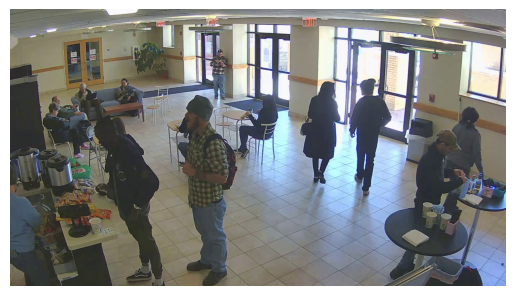

In [101]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np

image = video_data[:, 14].numpy().astype(np.uint8).transpose((1, 2, 0))
print(image.shape)
plt.imshow(image)
plt.axis('off')
plt.show()


0: 1152x2048 13 persons, 7950.3ms
Speed: 12.0ms preprocess, 7950.3ms inference, 199.3ms postprocess per image at shape (1, 3, 1152, 2048)


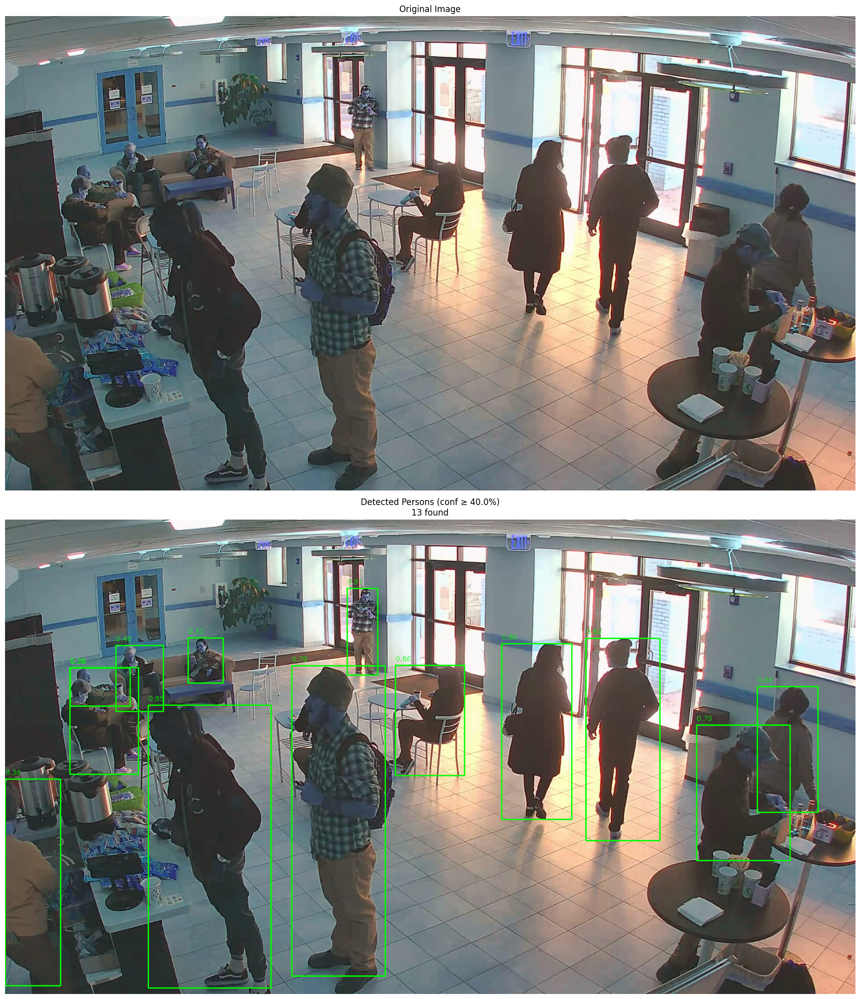

In [102]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# agnostic_nms:
# Enables class-agnostic Non-Maximum Suppression (NMS), 
# which merges overlapping boxes of different classes. 
# Useful in multi-class detection scenarios where class overlap is common.

person_id = 0
results = yolo_model(image, conf=0.2, iou=0.4, imgsz=2048, agnostic_nms=True, classes=[person_id])

def visualize_side_by_side(
    image, results, 
    upper_conf_threshold=0.5,
    box_color=(0, 255, 0),
    mask_color=(0, 255, 0),
):
    # Create blank images for visualization
    h, w = image.shape[:2]
    img_with_boxes = image.copy()
    mask_all = np.zeros((h, w), dtype=np.uint8)
    
    # Get class names
    # class_names = results[0].names
    # print(f"{class_names=}")
    
    # Process detections with confidence filtering
    confident_detections = 0
    
    for result in results:
        for box, mask in zip(result.boxes, result.masks):
            # if float(box.conf) < upper_conf_threshold:
            #     continue
                
            confident_detections += 1
            # Properly extract and format coordinates
            xyxy = box.xyxy[0].cpu().numpy()
            x1, y1, x2, y2 = map(int, xyxy)
            
            # Correct rectangle drawing syntax
            cv2.rectangle(img_with_boxes, (x1, y1), (x2, y2), box_color, 2)
            
            # Add confidence label
            label = f"{float(box.conf):.2f}"
            cv2.putText(
                img_with_boxes, label, (x1, y1-10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, box_color, 1)
            
            # Resize and apply mask
            mask_resized = cv2.resize(mask.data[0].cpu().numpy(), (w, h))
            mask_all = np.maximum(mask_all, (mask_resized > 0.5).astype(np.uint8))
    
    # Create mask overlay
    overlay = image.copy()
    overlay[mask_all == 1] = box_color
    result_img = cv2.addWeighted(img_with_boxes, 0.7, overlay, 0.3, 0)
    
    # Convert images to RGB for matplotlib
    original_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result_rgb = cv2.cvtColor(img_with_boxes, cv2.COLOR_BGR2RGB)
    
    # Create side-by-side visualization
    plt.figure(figsize=(20, 20))
    
    plt.subplot(2, 1, 1)
    plt.imshow(original_rgb)
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(2, 1, 2)
    plt.imshow(result_rgb)
    plt.title(f'Detected Persons (conf ≥ {upper_conf_threshold*100}%)\n{confident_detections} found')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return result_img

# Usage
visualized_image = visualize_side_by_side(image, results, upper_conf_threshold=0.4)

In [129]:
video_data.shape

torch.Size([3, 16, 1080, 1920])


0: 576x1024 9 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 429.6ms
Speed: 7.3ms preprocess, 429.6ms inference, 2.3ms postprocess per image at shape (1, 3, 576, 1024)


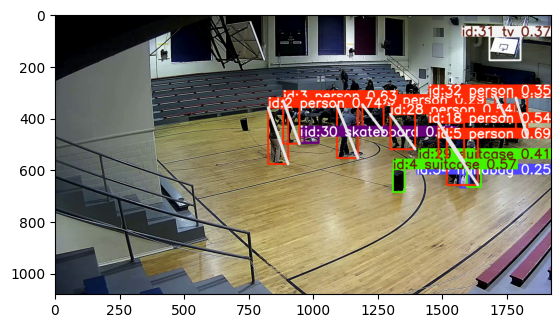


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 228.7ms
Speed: 5.3ms preprocess, 228.7ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)


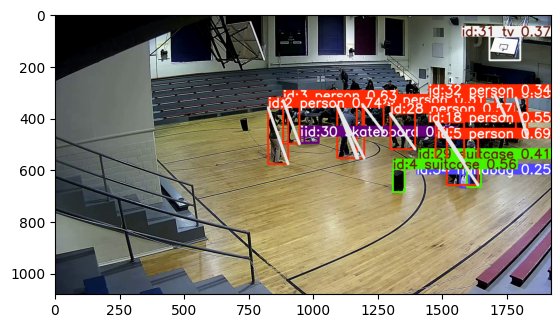


0: 576x1024 9 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 233.2ms
Speed: 5.3ms preprocess, 233.2ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)


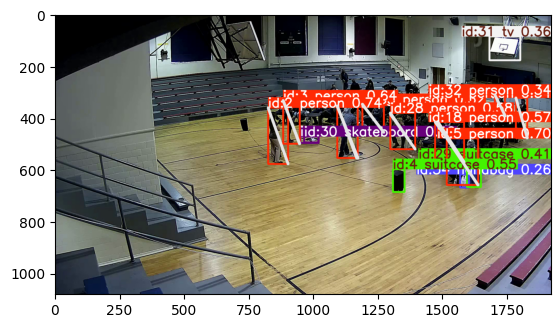


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 244.6ms
Speed: 5.4ms preprocess, 244.6ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)


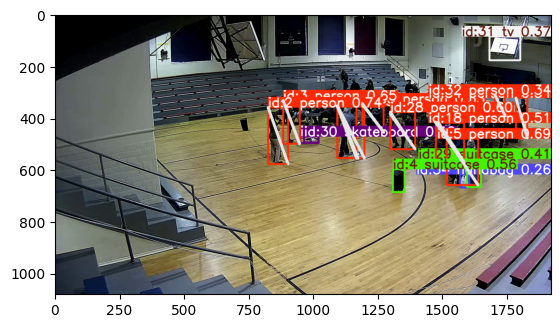


0: 576x1024 9 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 238.2ms
Speed: 5.5ms preprocess, 238.2ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 1024)


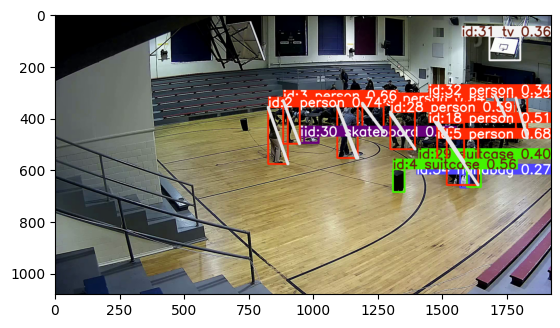


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 235.2ms
Speed: 5.7ms preprocess, 235.2ms inference, 2.2ms postprocess per image at shape (1, 3, 576, 1024)


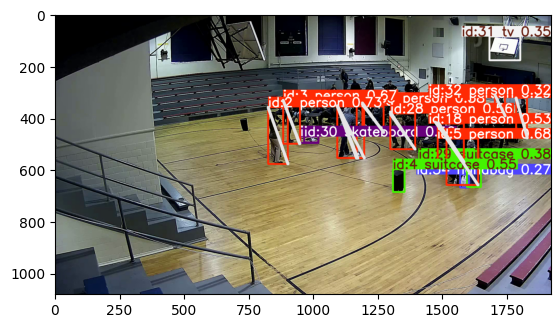


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 231.1ms
Speed: 5.8ms preprocess, 231.1ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)


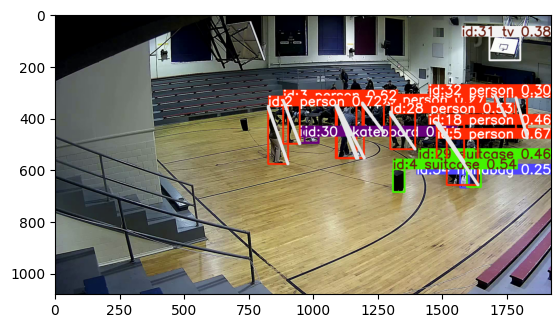


0: 576x1024 11 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 231.0ms
Speed: 5.6ms preprocess, 231.0ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 1024)


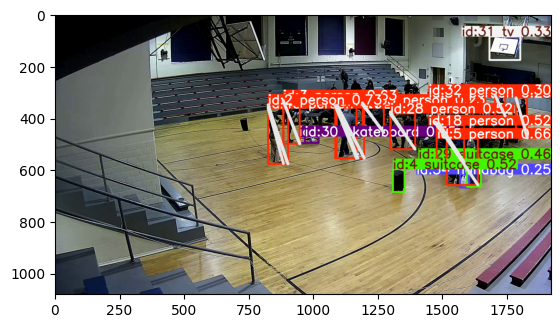


0: 576x1024 11 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 232.1ms
Speed: 5.6ms preprocess, 232.1ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 1024)


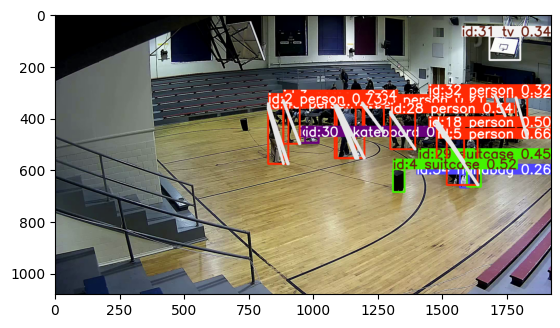


0: 576x1024 11 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 231.1ms
Speed: 5.7ms preprocess, 231.1ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 1024)


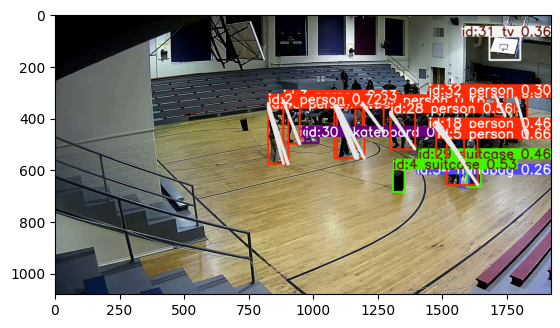


0: 576x1024 11 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 227.5ms
Speed: 5.7ms preprocess, 227.5ms inference, 1.7ms postprocess per image at shape (1, 3, 576, 1024)


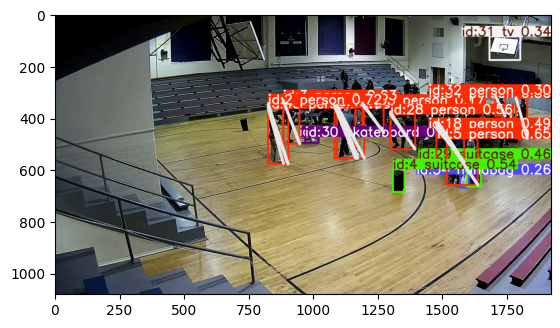


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 235.6ms
Speed: 5.9ms preprocess, 235.6ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)


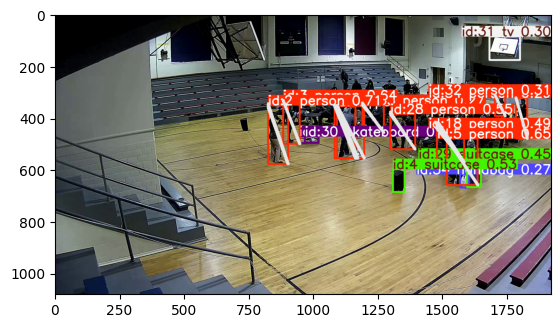


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 238.9ms
Speed: 6.3ms preprocess, 238.9ms inference, 1.9ms postprocess per image at shape (1, 3, 576, 1024)


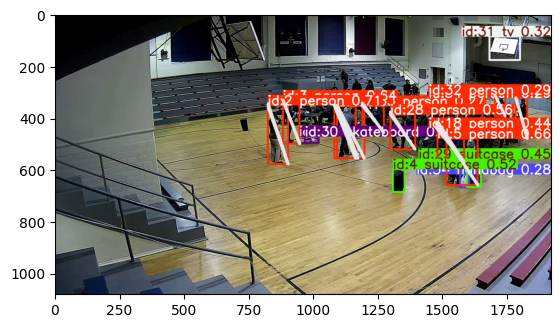


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 242.1ms
Speed: 5.9ms preprocess, 242.1ms inference, 2.1ms postprocess per image at shape (1, 3, 576, 1024)


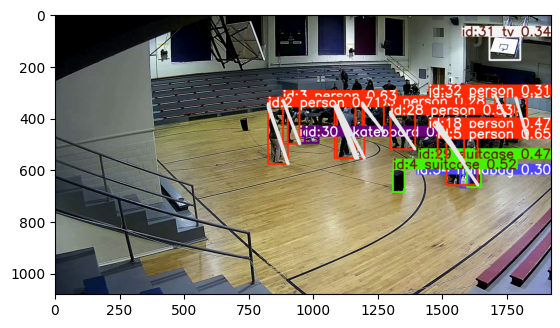


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 233.5ms
Speed: 5.6ms preprocess, 233.5ms inference, 2.1ms postprocess per image at shape (1, 3, 576, 1024)


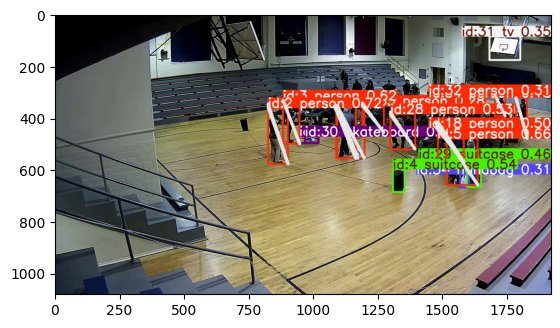


0: 576x1024 10 persons, 1 handbag, 2 suitcases, 2 skateboards, 1 tv, 240.5ms
Speed: 6.1ms preprocess, 240.5ms inference, 2.0ms postprocess per image at shape (1, 3, 576, 1024)


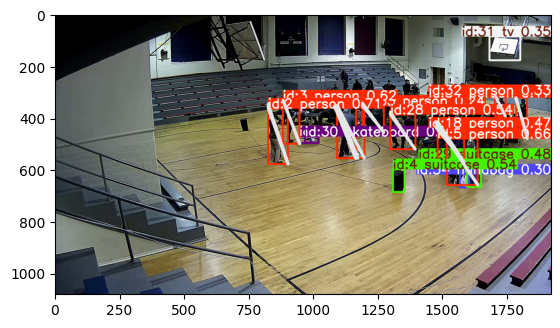

In [130]:
from collections import defaultdict
import cv2

track_history = defaultdict(lambda: [])

for t in range(video_data.shape[1]):
    frame = video_data[:, t].numpy().astype(np.uint8).transpose((1, 2, 0))
    results = yolo_model.track(frame, persist=True, imgsz=1024)
    boxes = results[0].boxes.xyxy.cpu()
    track_ids = results[0].boxes.id.int().cpu().tolist()
    names = [results[0].names[cls.item()] for cls in results[0].boxes.cls.int()]
    annotated_frame = results[0].plot()
    filtered = [d for d in zip(boxes, track_ids, names) if d[2] == 'person']
    for box, track_id, name in filtered:
        coords = list(map(float, box))
        track = track_history[track_id]
        track.append(coords)
        if len(track) > 30:
            track.pop(0)
        points = np.hstack(track).astype(np.int32).reshape((-1, 1, 2))
        cv2.polylines(
            annotated_frame, [points], 
            isClosed=False, color=(230, 230, 230), thickness=10)
    plt.imshow(annotated_frame)
    plt.show()

In [131]:
track_history.keys()

dict_keys([2, 3, 5, 18, 28, 32, 34, 35, 42, 1, 45])

In [132]:
track_history[2]

[[823.4841918945312, 361.33941650390625, 900.422607421875, 578.1754150390625],
 [823.5426635742188, 361.4483947753906, 900.3916015625, 578.0787353515625],
 [823.5731201171875, 361.6981201171875, 900.1506958007812, 578.0733642578125],
 [823.5631713867188, 360.90655517578125, 900.1167602539062, 578.0670166015625],
 [823.5263671875, 359.9577941894531, 899.9840698242188, 578.0496215820312],
 [823.4740600585938, 359.39886474609375, 899.8522338867188, 578.0032958984375],
 [823.2879028320312, 355.3390197753906, 900.3773803710938, 578.1195068359375],
 [823.241943359375, 349.82843017578125, 900.8857421875, 578.160888671875],
 [823.1949462890625, 345.7012939453125, 901.1712036132812, 578.1639404296875],
 [823.1427001953125, 347.6006164550781, 901.1763916015625, 578.1424560546875],
 [823.1192016601562, 348.5196228027344, 901.1370849609375, 578.1541137695312],
 [823.049072265625, 352.0608825683594, 900.8560791015625, 578.2158203125],
 [822.9900512695312, 352.657470703125, 900.7526245117188, 578.23

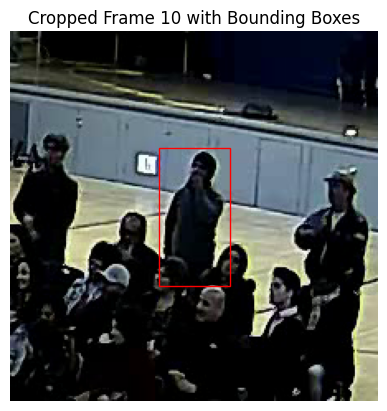

In [154]:
import torch
import numpy as np
from models.box_list import BoxList
import matplotlib.patches as patches

def extract_frames(track_id):
    th = track_history[track_id]  # List of [x1,y1,x2,y2] boxes

    # Convert to numpy array for easier calculations
    boxes = np.array(th)

    # 1. Find the largest spatial crop that contains the object in all frames
    # Get min/max coordinates across all frames
    min_x = np.min(boxes[:, 0])  # Minimum x1 across all frames
    min_y = np.min(boxes[:, 1])  # Minimum y1 across all frames
    max_x = np.max(boxes[:, 2])  # Maximum x2 across all frames
    max_y = np.max(boxes[:, 3])  # Maximum y2 across all frames

    # Add some padding (optional)
    padding = 1
    min_x = max(0, min_x - padding)
    min_y = max(0, min_y - padding)
    max_x = min(video_data.shape[3], max_x + padding)  # video_data.shape[3] is width
    max_y = min(video_data.shape[2], max_y + padding)  # video_data.shape[2] is height

    # Convert to integers for cropping
    min_x, min_y, max_x, max_y = map(int, [min_x, min_y, max_x, max_y])
    
    size = 224
    
    pad_x = max(size - (max_x - min_x), 0) // 2
    pad_y = max(size - (max_y - min_y), 0) // 2

    # 2. Crop the video data both spatially and temporally
    # Assuming video_data is in shape [C, T, H, W]
    cropped_video = video_data[:,:,(min_y-pad_y):(max_y+pad_y),(min_x-pad_x):(max_x+pad_x)]

    # 5. Convert to torch tensor and return as BoxList
    adjusted_boxes_tensor = torch.tensor(
        [[pad_x, pad_y, pad_x + (max_x - min_x), pad_y + (max_y - min_y)]], dtype=torch.float32)
    boxlist = BoxList(adjusted_boxes_tensor, (cropped_video.shape[2], cropped_video.shape[3]), mode="xyxy")
    
    return cropped_video, boxlist


def show_frame(video, bboxes, frame_id):
    frame = video[:, frame_id].numpy().astype(np.uint8).transpose(1, 2, 0)
    
    # Create figure and axes
    fig, ax = plt.subplots(1)
    
    # Display the image
    ax.imshow(frame)
    
    # Add each bounding box
    for bbox in bboxes.bbox:  # Assuming bboxes is a dictionary with frame_id as key
        # bbox format: [x1, y1, x2, y2] or similar
        x1, y1, x2, y2 = bbox
        width = x2 - x1
        height = y2 - y1
        
        # Create a rectangle patch
        rect = patches.Rectangle((x1, y1), width, height, 
                                 linewidth=1, edgecolor='r', facecolor='none')
        
        # Add the patch to the axes
        ax.add_patch(rect)
    
    plt.title(f"Cropped Frame {frame_id} with Bounding Boxes")
    plt.axis('off')
    plt.show()

# Show first frame as example
frames, bboxes = extract_frames(list(track_history.keys())[5])
show_frame(frames, bboxes, 10)

In [144]:
bboxes.bbox

tensor([[ 71.,   0., 152., 235.]])

In [134]:
frames.shape

torch.Size([3, 16, 235, 223])

h=1080 w=1920 c=3

0: 1152x2048 43 persons, 2 boats, 1 handbag, 2 suitcases, 1018.3ms
Speed: 44.2ms preprocess, 1018.3ms inference, 4.4ms postprocess per image at shape (1, 3, 1152, 2048)
[BoxList(num_boxes=15, image_width=224, image_height=224, mode=xyxy)]


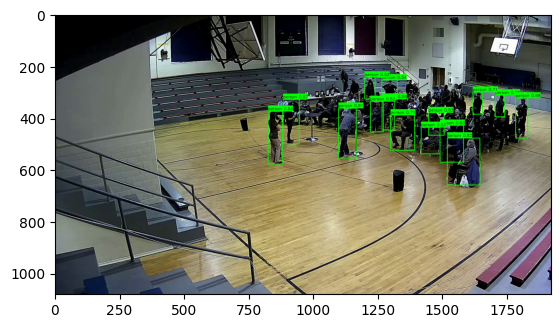

In [133]:
import cv2
import torch
from models.box_list import BoxList

img_with_boxes = image.copy()

h, w, c = image.shape
print(f"{h=} {w=} {c=}")

results = yolo_model(image, imgsz=2048)

batch_bboxes = []

for result in results:
    xywh = result.boxes.xywh  # center-x, center-y, width, height
    xywhn = result.boxes.xywhn  # normalized
    xyxy = result.boxes.xyxy  # top-left-x, top-left-y, bottom-right-x, bottom-right-y
    xyxyn = result.boxes.xyxyn  # normalized
    names = [result.names[cls.item()] for cls in result.boxes.cls.int()]  # class name of each box
    confs = result.boxes.conf  # confidence score of each box
    
    color = (0, 255, 0)
    font_scale = 0.5
    
    bboxes = []
    
    for box, cls_name, conf in zip(xyxy, names, confs):
        x1, y1, x2, y2 = map(int, box)
        
        if conf < 0.5 or cls_name != 'person':
            continue
        
        cv2.rectangle(
            img_with_boxes, 
            (x1, y1), (x2, y2), color, 2)
        
        label = f"{cls_name} {conf:.2f}"
        
        (text_width, text_height), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, font_scale, 1)
        
        cv2.rectangle(
            img_with_boxes, (x1, y1 - text_height - 10), (x1 + text_width, y1), 
            color, -1)
        
        cv2.putText(
            img_with_boxes, label, (x1, y1 - 5), 
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)
        
        bboxes.append(box)
        
    batch_bboxes.append(BoxList(torch.stack(bboxes, dim=0), image_size=(w, h)).resize((224, 224)))

print(batch_bboxes)
        
plt.imshow(img_with_boxes)
plt.show()

In [104]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
seed = 2024
torch_deterministic = True
num_classes = 5

In [105]:
system_root = '/kaggle/working'

In [106]:
finetune = f"{system_root}/checkpoint.pth"

In [107]:
!gdown '1nU-H1u3eJ-VuyCveU7v-WIOcAVxs5Hww' --output {finetune}

Downloading...
From (original): https://drive.google.com/uc?id=1nU-H1u3eJ-VuyCveU7v-WIOcAVxs5Hww
From (redirected): https://drive.google.com/uc?id=1nU-H1u3eJ-VuyCveU7v-WIOcAVxs5Hww&confirm=t&uuid=123f5bed-276b-4d1e-a7d5-a81501d5cd8e
To: /kaggle/working/checkpoint.pth
100%|███████████████████████████████████████| 96.2M/96.2M [00:00<00:00, 172MB/s]


In [108]:
import random 
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.backends.cudnn.deterministic = torch_deterministic

In [109]:
checkpoint = torch.load(finetune, map_location=device)
checkpoint_model = checkpoint['model']

In [ ]:
import torch
import torch.nn as nn
from models.model1 import VisionTransformer
from functools import partial

model = VisionTransformer(
    patch_size=16,
    num_classes=num_classes,
    embed_dim=384,
    depth=12,
    num_heads=6,
    mlp_ratio=4,
    qkv_bias=True,
    drop_rate=0.0,
    drop_path_rate=0.2,
    attn_drop_rate=0.0,
    norm_layer=partial(nn.LayerNorm, eps=1e-6),
    init_scale=0.001,
    all_frames=16,
    tubelet_size=2,
    use_checkpoint=False,
    use_mean_pooling=True)

In [111]:
for name, param in model.named_parameters():
    if (name.startswith('rpn_network')
        or name.startswith('bbox_head')
        or name.startswith('head')
        or name.startswith('roi_heads')):
        continue
    param.requires_grad = False

In [112]:
state_dict = model.state_dict()
state_dict.keys()

for k in ['head.weight', 'head.bias']:
    if k in checkpoint_model and checkpoint_model[k].shape != state_dict[k].shape:
        print(f"Removing key {k} from pretrained checkpoint")
        del checkpoint_model[k]

In [113]:
from collections import OrderedDict

all_keys = list(checkpoint_model.keys())
new_dict = OrderedDict()
for key in all_keys:
    if key.startswith('backbone.'):
        new_dict[key[9:]] = checkpoint_model[key]
    elif key.startswith('encoder.'):
        new_dict[key[8:]] = checkpoint_model[key]
    elif (key.startswith('decoder.')
          or key == 'mask_token'
          or key.startswith('encoder_to_decoder')):
        continue
    else:
        new_dict[key] = checkpoint_model[key]

checkpoint_model = new_dict

In [114]:
model.load_state_dict(checkpoint_model, strict=False)

_IncompatibleKeys(missing_keys=['head.weight', 'head.bias'], unexpected_keys=[])

In [115]:
from transforms.transforms import UniformTemporalSubsample, ShortSideScaleWithBoxes
from torchvision.transforms._transforms_video import (
    CenterCropVideo,
    NormalizeVideo,
)
from torchvision.transforms import Compose, Lambda
from torchvision.transforms._transforms_video import NormalizeVideo

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
crop_size = 224
transform = Compose([
    UniformTemporalSubsample(clip_len),
    Lambda(lambda x: x/255.0),
    NormalizeVideo(mean, std),
    ShortSideScaleWithBoxes(size=crop_size),
    CenterCropVideo(crop_size=crop_size)
])

video_data = transform(video_data)

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/_functional_video.py:6: UserWarning: The 'torchvision.transforms._functional_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms.functional' module instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/transforms/_transforms_video.py:22: UserWarning: The 'torchvision.transforms._transforms_video' module is deprecated since 0.12 and will be removed in the future. Please use the 'torchvision.transforms' module instead.
  warnings.warn(


In [119]:
video_data.unsqueeze(0).shape

torch.Size([1, 3, 16, 224, 224])

In [135]:
video_result = model(video_data.unsqueeze(0), boxes=batch_bboxes)

In [136]:
batch_bboxes

[BoxList(num_boxes=15, image_width=224, image_height=224, mode=xyxy)]

In [137]:
video_result.shape

torch.Size([15, 5])

In [138]:
video_result, batch_bboxes[0].bbox

(tensor([[ 5.4389e-05, -1.2124e-04,  2.7014e-04, -1.4473e-04,  2.2783e-04],
         [-2.3243e-05,  6.6678e-05,  2.3557e-04,  3.3692e-05,  4.1221e-04],
         [-9.2434e-05,  7.7539e-05,  2.7621e-04,  9.1786e-06,  2.9393e-04],
         [-2.1994e-05, -1.4009e-04,  2.0406e-04, -1.2461e-05,  2.5685e-04],
         [-4.5825e-05,  1.2118e-04,  3.7984e-04,  2.3560e-05,  2.5924e-04],
         [-5.0760e-05, -3.7465e-07,  2.7298e-04,  6.7873e-06,  4.2180e-04],
         [-8.2841e-05,  1.2702e-04,  4.3477e-04,  1.0738e-04,  2.7674e-04],
         [ 2.3285e-06,  1.9192e-04,  3.0941e-04, -4.7277e-05,  3.2366e-04],
         [-2.0157e-05, -8.5227e-05,  2.8984e-04, -1.4845e-04,  2.5627e-04],
         [-3.6317e-05,  6.1540e-05,  2.8706e-04, -7.2652e-05,  3.8451e-04],
         [-1.1671e-04,  3.3440e-05,  3.0685e-04, -7.6284e-05,  3.4837e-04],
         [ 8.2591e-06,  1.8437e-04,  4.1390e-04, -3.0504e-05,  3.0932e-04],
         [ 1.1538e-05,  1.8539e-04,  3.8114e-04, -3.0392e-05,  3.2619e-04],
         [ 4

In [155]:
frames, bboxes = extract_frames(1)
print(f"{frames.unsqueeze(0).shape=}")
video_result = model(frames.unsqueeze(0), boxes=bboxes)

frames.unsqueeze(0).shape=torch.Size([1, 3, 16, 223, 223])


In [156]:
bboxes

BoxList(num_boxes=1, image_width=223, image_height=223, mode=xyxy)

In [157]:
video_result.shape

torch.Size([1, 5])

In [158]:
video_result

tensor([[-0.0007, -0.0008, -0.0006,  0.0008, -0.0005]], grad_fn=<AddmmBackward0>)